In [1]:
import scanpy as sc

In [2]:
import glob
import os
import numpy as np

import seaborn as sns

import pandas as pd
import scipy.stats
import tqdm
import matplotlib.pyplot as plt
from adjustText import adjust_text

In [3]:
import gc

## Read adata

In [5]:
data_path = 'tmp'
motif_path = os.path.join(data_path, 'motif_deletion/')

In [6]:
adata = sc.read(
    os.path.join(data_path, 'bmmc_multiome_multivi_neurips21_curated_new_palantir_fixed_GEX.h5ad'))

## Read ref and alternative

In [9]:
alts = pd.Series([x for x in glob.glob(f'{motif_path}*multiome_fixed.h5ad') if 'ref_multiome' not in x and "atac" not in x and 'rna' not in x])

In [12]:
ad_ref = sc.read(os.path.join(motif_path, 'ref_multiome_fixed.h5ad'))

In [13]:
ad_ref = ad_ref[adata.obs_names]

In [16]:
gene_set_to_run = ad_ref.var_names

In [18]:
median_sf=np.median(ad_ref.X.sum(axis=1))

In [19]:
sc.pp.normalize_total(ad_ref, target_sum=median_sf, key_added='size_factor')

/opt/modules/i12g/anaconda/envs/borzoi-pytorch/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [20]:
diff_rna = {}
diff_atac = {}
norm_factor = ad_ref.obs['size_factor'].values[:, None]
for i, alt in tqdm.tqdm(enumerate(alts)):
    # if i == 10:
    #     break
    ad_alt = sc.read(alt)
    motif_name = os.path.basename(alt).split('alt_')[1].split('_multiome_fixed.h5ad')[0]
    ad_alt = ad_alt[adata.obs_names, list(gene_set_to_run)]

    ad_alt.X = ad_alt.X/norm_factor * median_sf
    motif_rna = (np.log2(ad_ref.X+1) - np.log2(ad_alt.X+1)).mean(axis=1).squeeze()
  
    diff_rna.update({motif_name: motif_rna})
    del ad_alt
    gc.collect()

0it [00:00, ?it/s]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


1it [00:08,  8.96s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


2it [00:17,  8.78s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


3it [00:26,  8.64s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


4it [00:34,  8.72s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


5it [00:44,  8.86s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


6it [00:53,  8.93s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


7it [01:02,  8.98s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


8it [01:11,  9.02s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


9it [01:19,  8.92s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


10it [01:29,  8.97s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


11it [01:38,  9.05s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


12it [01:47,  9.04s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


13it [01:56,  9.12s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


14it [02:05,  9.01s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


15it [02:14,  8.95s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


16it [02:23,  9.01s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


17it [02:32,  8.94s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


18it [02:40,  8.83s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


19it [02:49,  8.82s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


20it [02:58,  8.77s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


21it [03:06,  8.79s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


22it [03:15,  8.81s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


23it [03:24,  8.90s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


24it [03:34,  9.07s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


25it [03:44,  9.25s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


26it [03:54,  9.49s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


27it [04:03,  9.30s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


28it [04:11,  9.18s/it]

Only considering the two last: ['.C_multiome_fixed', '.h5ad'].
Only considering the two last: ['.C_multiome_fixed', '.h5ad'].


29it [04:21,  9.42s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


30it [04:31,  9.44s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


31it [04:41,  9.51s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


32it [04:50,  9.45s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


33it [04:59,  9.33s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


34it [05:08,  9.38s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


35it [05:20, 10.03s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


36it [05:29,  9.70s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


37it [05:38,  9.60s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


38it [05:48,  9.56s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


39it [05:57,  9.39s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


40it [06:06,  9.39s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


41it [06:15,  9.35s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


42it [06:25,  9.30s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


43it [06:34,  9.25s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


44it [06:43,  9.29s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


45it [06:53,  9.41s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


46it [07:02,  9.32s/it]

Only considering the two last: ['.C_multiome_fixed', '.h5ad'].
Only considering the two last: ['.C_multiome_fixed', '.h5ad'].


47it [07:11,  9.23s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


48it [07:20,  9.20s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


49it [07:29,  9.11s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


50it [07:38,  9.21s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


51it [07:47,  9.19s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


52it [07:56,  9.13s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


53it [08:06,  9.29s/it]

Only considering the two last: ['.C_multiome_fixed', '.h5ad'].
Only considering the two last: ['.C_multiome_fixed', '.h5ad'].


54it [08:16,  9.51s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


55it [08:26,  9.60s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


56it [08:35,  9.42s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


57it [08:44,  9.29s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


58it [08:53,  9.35s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


59it [09:03,  9.30s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


60it [09:11,  9.14s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


61it [09:20,  9.12s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


62it [09:30,  9.30s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


63it [09:40,  9.42s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


64it [09:50,  9.53s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


65it [09:59,  9.47s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


66it [10:09,  9.61s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


67it [10:18,  9.58s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


68it [10:27,  9.42s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


69it [10:37,  9.40s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


70it [10:46,  9.32s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


71it [10:55,  9.27s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


72it [11:04,  9.09s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


73it [11:13,  9.09s/it]

Only considering the two last: ['.C_multiome_fixed', '.h5ad'].
Only considering the two last: ['.C_multiome_fixed', '.h5ad'].


74it [11:22,  9.05s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


75it [11:32,  9.39s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


76it [11:41,  9.37s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


77it [11:51,  9.33s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


78it [12:00,  9.31s/it]

Only considering the two last: ['.A_multiome_fixed', '.h5ad'].
Only considering the two last: ['.A_multiome_fixed', '.h5ad'].


79it [12:09,  9.28s/it]

Only considering the two last: ['.C_multiome_fixed', '.h5ad'].
Only considering the two last: ['.C_multiome_fixed', '.h5ad'].


80it [12:19,  9.40s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


81it [12:28,  9.50s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


82it [12:38,  9.41s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


83it [12:47,  9.39s/it]

Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


84it [12:56,  9.24s/it]


In [21]:
diff_rna = pd.DataFrame(diff_rna, index=ad_ref.obs_names)
diff_rna.columns = diff_rna.columns + '.' + diff_rna.columns

In [24]:
dev = sc.read(os.path.join(data_path, 'scBasset/adata_w_tf_activity.h5ad'))

In [25]:
diff_rna = diff_rna.drop(['TEAD2.H12CORE.0.PSM.A.TEAD2.H12CORE.0.PSM.A', 'TRPS1.H12CORE.0.P.B.TRPS1.H12CORE.0.P.B', 'MBNL2.H12CORE.0.S.C.MBNL2.H12CORE.0.S.C', 'ZEB2.H12CORE.0.P.B.ZEB2.H12CORE.0.P.B', 'COE1.H12CORE.0.P.B.COE1.H12CORE.0.P.B'], axis =1)

In [26]:
dev = dev[diff_rna.index].obs[diff_rna.columns.to_frame()[0].str.split(".").str[:1].apply(lambda x: 'bas_' +x[0])]

In [192]:
dev#[:'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A']
dev[:,'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'].X#[:,"PAX5"]#.var.TF

ArrayView([[ 2.7893152 ],
           [-0.44355989],
           [ 0.34597751],
           ...,
           [-0.6781351 ],
           [-0.21975745],
           [ 1.1041715 ]], dtype=float32)

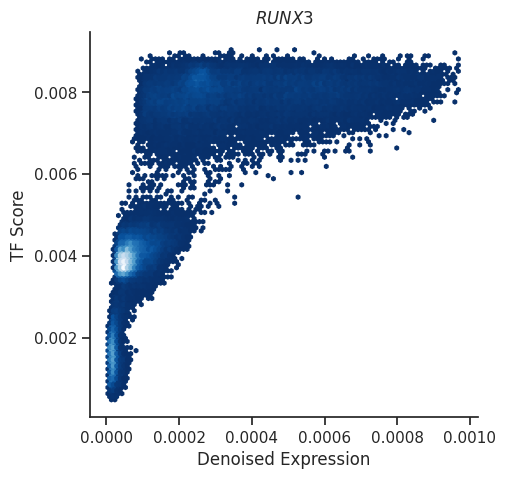

In [230]:
fig, ax = plt.subplots(figsize= (5,5))
ax.hexbin(x =expr_denoised['RUNX3'].values.squeeze(), y = diff_rna['RUNX3.H12CORE.1.S.B.RUNX3.H12CORE.1.S.B'], mincnt=1, cmap='Blues_r')
ax.set_xlabel("Denoised Expression")
ax.set_ylabel("TF Score")
ax.set_title(r"$RUNX3$")
fig.savefig('RUNX3_TF_vs_expr.png', dpi =300, bbox_inches = 'tight')

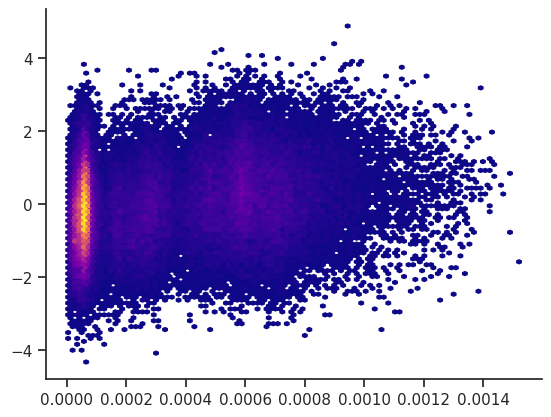

In [142]:
plt.hexbin(x=expr_denoised["ETS1"].values.squeeze(), y = dev[:,'ETS1.H12CORE.0.S.B.ETS1.H12CORE.0.S.B'].X.squeeze(), mincnt=1, cmap='plasma')#, norm=LogNorm()) #[adata[:, "PAX5"].X.A.squeeze().nonzero()[0]]

In [268]:
test = sc.read('/data/ceph/hdd/project/node_09/semi_supervised_multispecies/Downstream/single_cell/results/motif_deletion/alt_KLF1.H12CORE.0.P.B_multiome_fixed.h5ad')
test.X = test.X/norm_factor * median_sf
# motif_rna = scipy.stats.zscore(np.abs(np.log2(ad_ref.X+1) - np.log2(ad_alt.X+1)).mean(axis=1).squeeze())
# motif_atac = scipy.stats.zscore(np.abs(np.log2(ad_ref.layers['atac']+1) - np.log2(ad_alt.layers['atac']+1)).mean(axis=1).squeeze())

motif_rna = (np.log2(ad_ref.X+1) - np.log2(test.X+1)).mean(axis=1).squeeze()
test.obs['motif_effect'] =motif_rna
test.obsm['X_umap'] = adata.obsm['X_umap']


Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


In [286]:
scipy.stats.spearmanr(dev[:,'KLF12.H12CORE.1.PSM.A.KLF12.H12CORE.1.PSM.A'].X.squeeze(), dev[:,'KLF1.H12CORE.0.P.B.KLF1.H12CORE.0.P.B'].X.squeeze())

PearsonRResult(statistic=0.5449945697333012, pvalue=0.0)

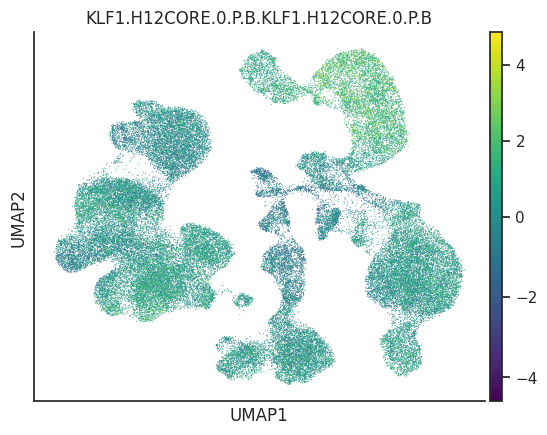

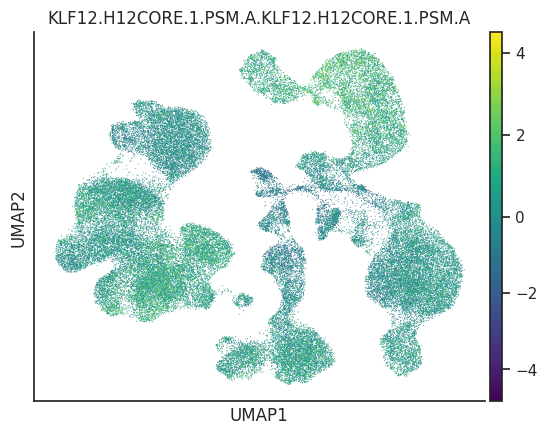

In [281]:
dev.obsm['X_umap'] = adata.obsm['X_umap']
sc.pl.umap(dev, color = 'KLF1.H12CORE.0.P.B.KLF1.H12CORE.0.P.B', vcenter = 0, cmap = 'viridis') #KLF12.H12CORE.1.PSM.A
sc.pl.umap(dev, color = 'KLF12.H12CORE.1.PSM.A.KLF12.H12CORE.1.PSM.A', vcenter = 0, cmap = 'viridis') #KLF12.H12CORE.1.PSM.A

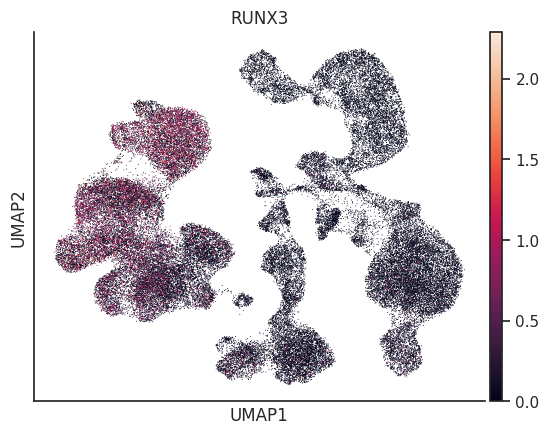

In [287]:
sc.pl.umap(adata, color = 'RUNX3')

In [274]:
scipy.stats.spearmanr(expr_denoised[['KLF6','KLF3','KLF2']].sum(axis =1),motif_rna)

SignificanceResult(statistic=0.6422279515286927, pvalue=0.0)

In [270]:
scipy.stats.spearmanr(expr_denoised[['KLF11', 'KLF3-AS1', 'KLF3',
       'KLF9', 'KLF6', 'KLF13', 'KLF16',
       'KLF1', 'KLF2']].sum(axis =1),motif_rna)

SignificanceResult(statistic=0.5053762931104676, pvalue=0.0)

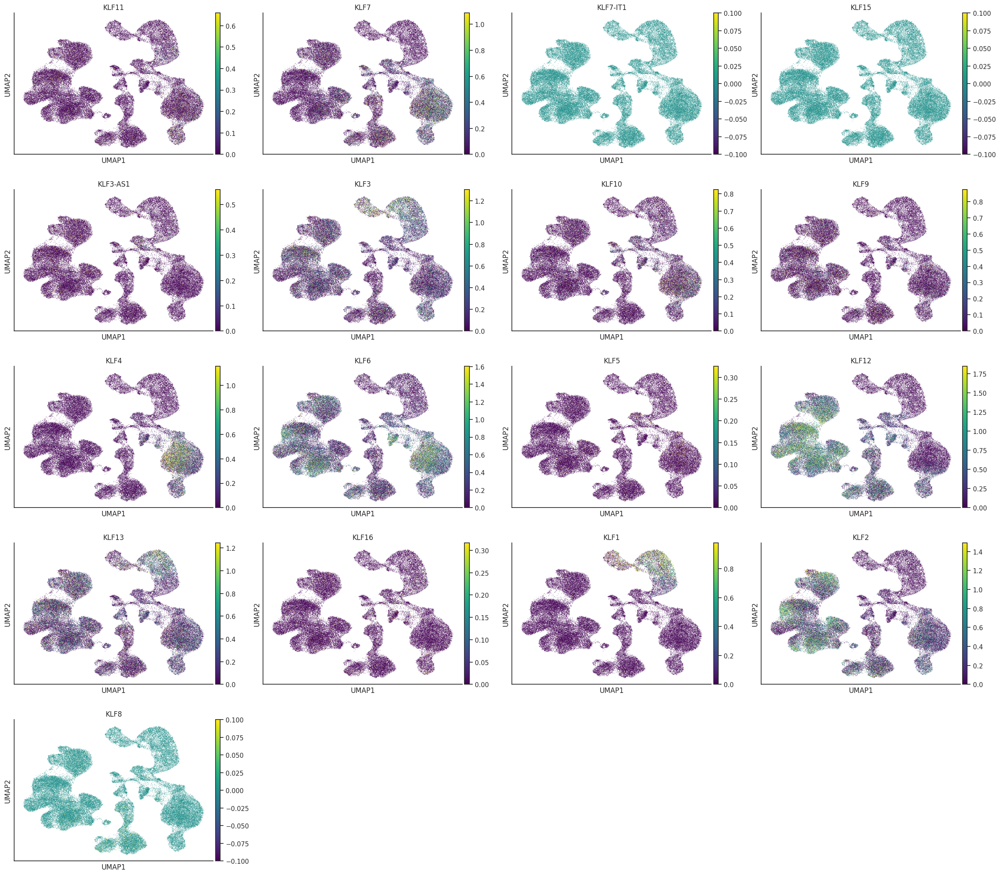

In [248]:
sc.pl.umap(adata, color = adata[:,adata.var_names.str.startswith('KLF')].var_names, vmax = 'p99', vmin =0, cmap = 'viridis')

In [124]:
scipy.stats.pearsonr(expr_denoised["PAX5"].values.squeeze(), dev[:,'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'].X.squeeze()), scipy.stats.spearmanr(expr_denoised["PAX5"].values.squeeze(), dev[:,'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'].X.squeeze())

(PearsonRResult(statistic=0.5140864532598917, pvalue=0.0),
 SignificanceResult(statistic=0.3356189476780479, pvalue=0.0))

In [117]:
scipy.stats.pearsonr(expr_denoised["PAX5"].values.squeeze(), diff_rna['PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A']), scipy.stats.spearmanr(expr_denoised["PAX5"].values.squeeze(), diff_rna['PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'])

(PearsonRResult(statistic=0.8471658545984985, pvalue=0.0),
 SignificanceResult(statistic=0.522347275732585, pvalue=0.0))

## Plot overall correlations

In [29]:
new_names_tf = {
    'TYY1': "YY1", 
    'STA5B':"STAT5B",
     'KAISO':"ZBTB33", 
    'STA5A': "STAT5A", 
    'COE1':"EBF1"
}

In [30]:
tf = dev.columns.to_frame()[0].str.split('_').str[1].to_list()

In [31]:
tf = pd.Series([tf_i if tf_i not in new_names_tf.keys() else new_names_tf[tf_i] for tf_i in tf])

In [33]:
expression_corr_norm = [scipy.stats.pearsonr(diff_rna[motif].values, adata[:, tf].X.A.squeeze())[0] for motif, tf in zip(diff_rna.columns, tf)]

In [37]:
expression_scbasset_norm = [scipy.stats.pearsonr(dev.loc[:, f"{motif}"].values.squeeze(), adata[:, tf].X.A.squeeze())[0] for motif, tf in zip(dev.columns, tf)]

FOS
FOSB
FOSL2


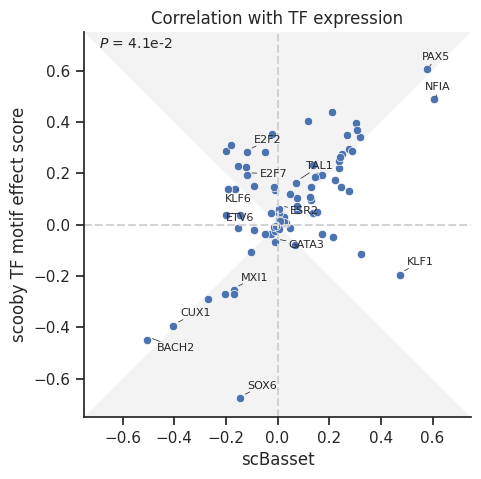

In [43]:
fig, ax = plt.subplots(figsize=(5,5))
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
ax = sns.scatterplot(x=expression_scbasset_norm, y=expression_corr_norm, ax=ax)

plt.axvline(0, linestyle ='--', color = 'lightgray')
plt.axhline(0, linestyle ='--', color = 'lightgray')

triangle = np.array([[0., 0.], [-1., 1.], [1, 1]])
polygon = plt.Polygon(triangle, closed=True,alpha=0.25, facecolor='lightgray', edgecolor=None, zorder = -100)
ax.add_patch(polygon)

triangle = np.array([[0., 0.], [-1., -1.], [1, -1]])
polygon = plt.Polygon(triangle, closed=True,alpha=0.25, facecolor='lightgray', edgecolor=None, zorder = -100)
ax.add_patch(polygon)

zipped = zip(expression_scbasset_norm, expression_corr_norm)
adj_text = []
for i, (x,y) in enumerate(zipped):
    name= tf.iloc[i]
    if (((x**2 + y**2) > 0.3) and name not in ['CEBPD',  'FOSL2', 'FOSB', 'RUNX2', 'MAFF', 'FOS', 'CREB5', 'KLF2', 'SOX5', 'JDP2', 'TFEC']) or name in ['ESR2', 'KLF6', 'E2F2', 'TAL1', 'MXI1', 'ETV6', 'GATA3', 'E2F7', 'KLF1'] : #or str(point['val']) in ['SOX13', 'FOSB', 'TEAD2',  'FLI1', 'FOXP1']:
        if name == 'COE1':
            name = 'EBF1'
        adj_text.append(ax.text(x + 0.01, y+0.01 , "" + f"{name}" +"", size= 8))
adjust_text(adj_text, expand=(2, 2), # expand text bounding boxes by 1.2 fold in x direction and 2 fold in y direction
            arrowprops=dict(arrowstyle='-', color='k', lw = 0.5) # ensure the labeling is clear by adding arrows
            );
ax.text(-0.69,0.69, r'$P$ = 4.1e-2', size = 10)
plt.xlim(-0.75,0.75)
plt.ylim(-0.75,0.75)
plt.title('Correlation with TF expression')
plt.xlabel("scBasset")
plt.ylabel("scooby TF motif effect score")
plt.savefig('../figures/figures/Figure3/scBasset_scDogRNA.png',  bbox_inches='tight', dpi = 300)

## scDog RNA only

In [47]:
alts = pd.Series([x for x in glob.glob(f'{motif_path}*rnaonly_fixed.h5ad') if 'ref_rnaonly' not in x and "atac" not in x])

In [50]:
ad_ref = sc.read(os.path.join(motif_path, 'ref_rnaonly_fixed.h5ad'))

In [51]:
ad_ref = ad_ref[adata.obs_names]

In [55]:
ad_ref = ad_ref[:,list(gene_set_to_run)]

In [56]:
median_sf=np.median(ad_ref.X.sum(axis=1))

In [57]:
sc.pp.normalize_total(ad_ref, target_sum=median_sf, key_added='size_factor')

/opt/modules/i12g/anaconda/envs/borzoi-pytorch/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [58]:
diff_rna = {}
diff_atac = {}
norm_factor = ad_ref.obs['size_factor'].values[:, None]
for i, alt in tqdm.tqdm(enumerate(alts)):
    ad_alt = sc.read(alt)
    motif_name = os.path.basename(alt).split('alt_')[1].split('_rnaonly_fixed.h5ad')[0]
    ad_alt = ad_alt[adata.obs_names, list(gene_set_to_run)]

    ad_alt.X = ad_alt.X/norm_factor * median_sf
    motif_rna = (np.log2(ad_ref.X+1) - np.log2(ad_alt.X+1)).mean(axis=1).squeeze()
    diff_rna.update({motif_name: motif_rna})
    del ad_alt
    gc.collect()

0it [00:00, ?it/s]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


1it [00:06,  6.49s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


2it [00:12,  6.41s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


3it [00:19,  6.67s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


4it [00:26,  6.72s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


5it [00:33,  6.62s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


6it [00:40,  6.82s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


7it [00:46,  6.63s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


8it [00:52,  6.52s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


9it [00:59,  6.58s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


10it [01:06,  6.60s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


11it [01:12,  6.59s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


12it [01:19,  6.55s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


13it [01:25,  6.51s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


14it [01:32,  6.61s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


15it [01:38,  6.54s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


16it [01:45,  6.58s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


17it [01:51,  6.55s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


18it [01:58,  6.54s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


19it [02:05,  6.54s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


20it [02:13,  7.22s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


21it [02:20,  6.96s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


22it [02:26,  6.88s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


23it [02:33,  6.80s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


24it [02:39,  6.67s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


25it [02:46,  6.62s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


26it [02:53,  6.64s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


27it [02:59,  6.56s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


28it [03:05,  6.53s/it]

Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].


29it [03:12,  6.54s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


30it [03:18,  6.48s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


31it [03:25,  6.51s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


32it [03:31,  6.53s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


33it [03:38,  6.49s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


34it [03:45,  6.75s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


35it [03:52,  6.64s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


36it [03:58,  6.57s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


37it [04:05,  6.63s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


38it [04:12,  6.74s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


39it [04:18,  6.67s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


40it [04:25,  6.71s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


41it [04:32,  6.67s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


42it [04:38,  6.70s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


43it [04:45,  6.63s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


44it [04:52,  6.64s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


45it [04:58,  6.63s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


46it [05:05,  6.77s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


47it [05:12,  6.82s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


48it [05:19,  6.80s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


49it [05:26,  6.77s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


50it [05:32,  6.74s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


51it [05:39,  6.70s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


52it [05:46,  6.75s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


53it [05:53,  6.80s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


54it [06:00,  6.94s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


55it [06:07,  6.87s/it]

Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].


56it [06:13,  6.79s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


57it [06:20,  6.67s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


58it [06:26,  6.68s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


59it [06:33,  6.70s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


60it [06:40,  6.69s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


61it [06:47,  6.71s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


62it [06:53,  6.66s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


63it [07:00,  6.63s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


64it [07:07,  6.78s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


65it [07:14,  6.83s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


66it [07:21,  6.83s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


67it [07:27,  6.75s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


68it [07:34,  6.83s/it]

Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].


69it [07:41,  6.77s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


70it [07:48,  6.82s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


71it [07:54,  6.70s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


72it [08:01,  6.72s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


73it [08:07,  6.65s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


74it [08:14,  6.63s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


75it [08:20,  6.60s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


76it [08:27,  6.65s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


77it [08:34,  6.77s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


78it [08:41,  6.68s/it]

Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.A_rnaonly_fixed', '.h5ad'].


79it [08:47,  6.66s/it]

Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.C_rnaonly_fixed', '.h5ad'].


80it [08:54,  6.67s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


81it [09:01,  6.71s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


82it [09:08,  6.72s/it]

Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].
Only considering the two last: ['.B_rnaonly_fixed', '.h5ad'].


83it [09:14,  6.69s/it]


In [59]:
diff_rna = pd.DataFrame(diff_rna, index=ad_ref.obs_names)
diff_rna.columns = diff_rna.columns + '.' + diff_rna.columns

In [63]:
diff_rna = diff_rna.drop(['TEAD2.H12CORE.0.PSM.A.TEAD2.H12CORE.0.PSM.A', 'TRPS1.H12CORE.0.P.B.TRPS1.H12CORE.0.P.B', 'MBNL2.H12CORE.0.S.C.MBNL2.H12CORE.0.S.C', 'ZEB2.H12CORE.0.P.B.ZEB2.H12CORE.0.P.B', 'COE1.H12CORE.0.P.B.COE1.H12CORE.0.P.B'], axis =1)

In [192]:
dev#[:'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A']
dev[:,'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'].X#[:,"PAX5"]#.var.TF

ArrayView([[ 2.7893152 ],
           [-0.44355989],
           [ 0.34597751],
           ...,
           [-0.6781351 ],
           [-0.21975745],
           [ 1.1041715 ]], dtype=float32)

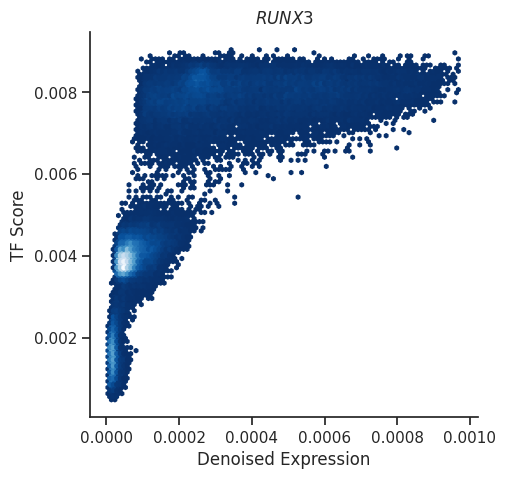

In [230]:
fig, ax = plt.subplots(figsize= (5,5))
ax.hexbin(x =expr_denoised['RUNX3'].values.squeeze(), y = diff_rna['RUNX3.H12CORE.1.S.B.RUNX3.H12CORE.1.S.B'], mincnt=1, cmap='Blues_r')
ax.set_xlabel("Denoised Expression")
ax.set_ylabel("TF Score")
ax.set_title(r"$RUNX3$")
fig.savefig('RUNX3_TF_vs_expr.png', dpi =300, bbox_inches = 'tight')

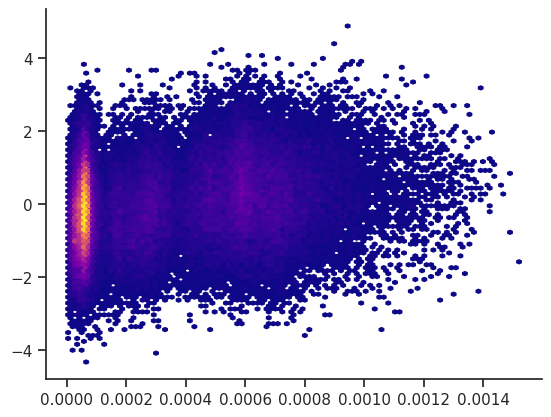

In [142]:
plt.hexbin(x=expr_denoised["ETS1"].values.squeeze(), y = dev[:,'ETS1.H12CORE.0.S.B.ETS1.H12CORE.0.S.B'].X.squeeze(), mincnt=1, cmap='plasma')#, norm=LogNorm()) #[adata[:, "PAX5"].X.A.squeeze().nonzero()[0]]

In [268]:
test = sc.read('/data/ceph/hdd/project/node_09/semi_supervised_multispecies/Downstream/single_cell/results/motif_deletion/alt_KLF1.H12CORE.0.P.B_multiome_fixed.h5ad')
test.X = test.X/norm_factor * median_sf
# motif_rna = scipy.stats.zscore(np.abs(np.log2(ad_ref.X+1) - np.log2(ad_alt.X+1)).mean(axis=1).squeeze())
# motif_atac = scipy.stats.zscore(np.abs(np.log2(ad_ref.layers['atac']+1) - np.log2(ad_alt.layers['atac']+1)).mean(axis=1).squeeze())

motif_rna = (np.log2(ad_ref.X+1) - np.log2(test.X+1)).mean(axis=1).squeeze()
test.obs['motif_effect'] =motif_rna
test.obsm['X_umap'] = adata.obsm['X_umap']


Only considering the two last: ['.B_multiome_fixed', '.h5ad'].
Only considering the two last: ['.B_multiome_fixed', '.h5ad'].


In [286]:
scipy.stats.spearmanr(dev[:,'KLF12.H12CORE.1.PSM.A.KLF12.H12CORE.1.PSM.A'].X.squeeze(), dev[:,'KLF1.H12CORE.0.P.B.KLF1.H12CORE.0.P.B'].X.squeeze())

PearsonRResult(statistic=0.5449945697333012, pvalue=0.0)

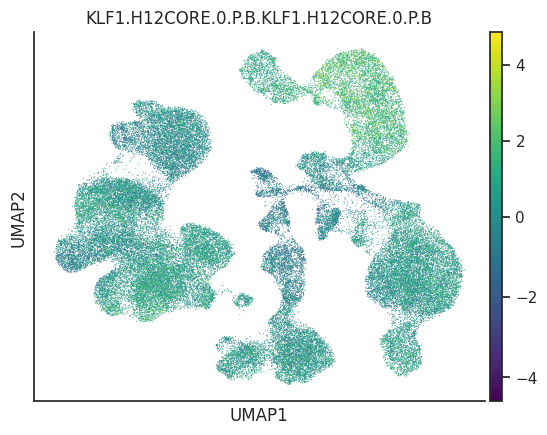

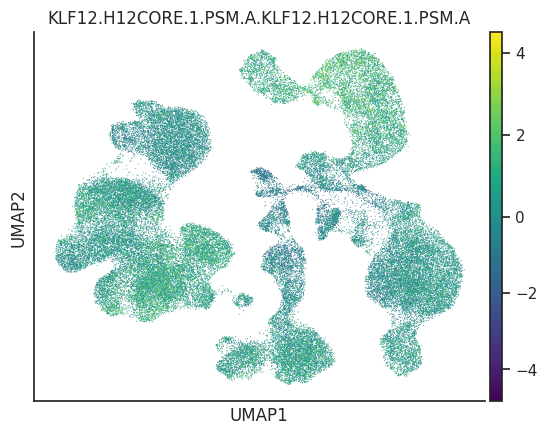

In [281]:
dev.obsm['X_umap'] = adata.obsm['X_umap']
sc.pl.umap(dev, color = 'KLF1.H12CORE.0.P.B.KLF1.H12CORE.0.P.B', vcenter = 0, cmap = 'viridis') #KLF12.H12CORE.1.PSM.A
sc.pl.umap(dev, color = 'KLF12.H12CORE.1.PSM.A.KLF12.H12CORE.1.PSM.A', vcenter = 0, cmap = 'viridis') #KLF12.H12CORE.1.PSM.A

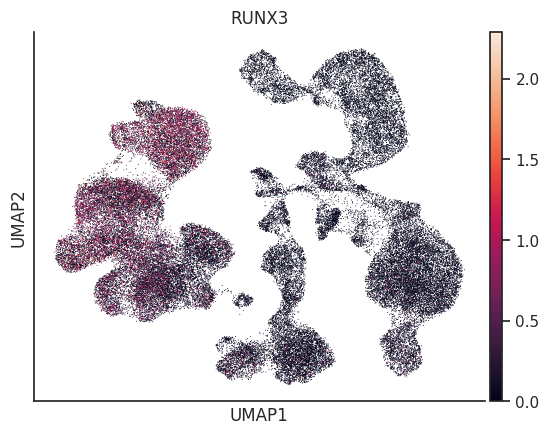

In [287]:
sc.pl.umap(adata, color = 'RUNX3')

In [274]:
scipy.stats.spearmanr(expr_denoised[['KLF6','KLF3','KLF2']].sum(axis =1),motif_rna)

SignificanceResult(statistic=0.6422279515286927, pvalue=0.0)

In [270]:
scipy.stats.spearmanr(expr_denoised[['KLF11', 'KLF3-AS1', 'KLF3',
       'KLF9', 'KLF6', 'KLF13', 'KLF16',
       'KLF1', 'KLF2']].sum(axis =1),motif_rna)

SignificanceResult(statistic=0.5053762931104676, pvalue=0.0)

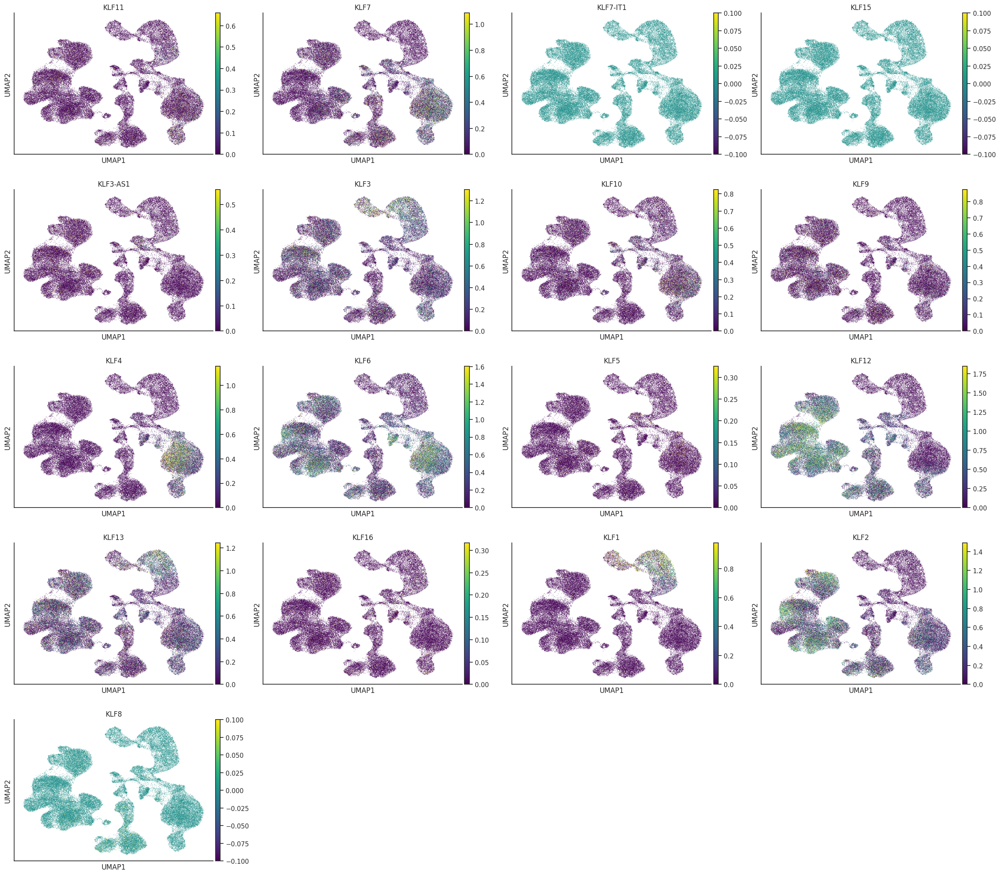

In [248]:
sc.pl.umap(adata, color = adata[:,adata.var_names.str.startswith('KLF')].var_names, vmax = 'p99', vmin =0, cmap = 'viridis')

In [124]:
scipy.stats.pearsonr(expr_denoised["PAX5"].values.squeeze(), dev[:,'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'].X.squeeze()), scipy.stats.spearmanr(expr_denoised["PAX5"].values.squeeze(), dev[:,'PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'].X.squeeze())

(PearsonRResult(statistic=0.5140864532598917, pvalue=0.0),
 SignificanceResult(statistic=0.3356189476780479, pvalue=0.0))

In [117]:
scipy.stats.pearsonr(expr_denoised["PAX5"].values.squeeze(), diff_rna['PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A']), scipy.stats.spearmanr(expr_denoised["PAX5"].values.squeeze(), diff_rna['PAX5.H12CORE.0.PS.A.PAX5.H12CORE.0.PS.A'])

(PearsonRResult(statistic=0.8471658545984985, pvalue=0.0),
 SignificanceResult(statistic=0.522347275732585, pvalue=0.0))

## Plot overall correlations

In [71]:
expression_corr_norm = [scipy.stats.pearsonr(diff_rna[motif].values, adata[:, tf].X.A.squeeze())[0] for motif, tf in zip(diff_rna.columns, tf)]

In [75]:
expression_scbasset_norm = [scipy.stats.pearsonr(dev.loc[:, f"{motif}"].values.squeeze(), adata[:, tf].X.A.squeeze())[0] for motif, tf in zip(dev.columns, tf)]

In [76]:
scipy.stats.wilcoxon(np.abs(expression_corr_norm),np.abs(expression_scbasset_norm), alternative='greater')

WilcoxonResult(statistic=1705.0, pvalue=0.20629800810090343)

FOS
FOSB
FOSL2


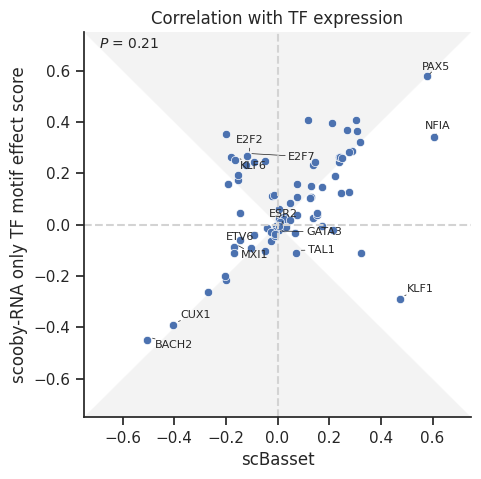

In [78]:
fig, ax = plt.subplots(figsize=(5,5))
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
ax = sns.scatterplot(x=expression_scbasset_norm, y=expression_corr_norm, ax=ax)

plt.axvline(0, linestyle ='--', color = 'lightgray')
plt.axhline(0, linestyle ='--', color = 'lightgray')

triangle = np.array([[0., 0.], [-1., 1.], [1, 1]])
polygon = plt.Polygon(triangle, closed=True,alpha=0.25, facecolor='lightgray', edgecolor=None, zorder = -100)
ax.add_patch(polygon)

triangle = np.array([[0., 0.], [-1., -1.], [1, -1]])
polygon = plt.Polygon(triangle, closed=True,alpha=0.25, facecolor='lightgray', edgecolor=None, zorder = -100)
ax.add_patch(polygon)


zipped = zip(expression_scbasset_norm, expression_corr_norm)
adj_text = []
for i, (x,y) in enumerate(zipped):
    name= tf.iloc[i]
    if (((x**2 + y**2) > 0.3) and name not in ['CEBPD',  'FOSL2', 'FOSB', 'RUNX2', 'MAFF', 'FOS', 'CREB5', 'KLF2', 'SOX5', 'JDP2', 'TFEC']) or name in ['ESR2', 'KLF6', 'E2F2', 'TAL1', 'MXI1', 'ETV6', 'GATA3', 'E2F7', 'KLF1'] : #or str(point['val']) in ['SOX13', 'FOSB', 'TEAD2',  'FLI1', 'FOXP1']:
        if name == 'COE1':
            name = 'EBF1'
        adj_text.append(ax.text(x + 0.01, y+0.01 , "" + f"{name}" +"", size= 8))
adjust_text(adj_text, expand=(2, 2), # expand text bounding boxes by 1.2 fold in x direction and 2 fold in y direction
            arrowprops=dict(arrowstyle='-', color='k', lw = 0.5) # ensure the labeling is clear by adding arrows
            );
ax.text(-0.69,0.69, r'$P$ = 0.21', size = 10)
#plt.legend([],[], frameon=False)
plt.xlim(-0.75,0.75)
plt.ylim(-0.75,0.75)
plt.title('Correlation with TF expression')
plt.xlabel("scBasset")
plt.ylabel("scooby-RNA only TF motif effect score")
plt.savefig('../figures/figures/Figure3/scBasset_scDogRNA_RNAonly.png',  bbox_inches='tight', dpi = 300)